In [49]:
#Import all necessary modules
import pandas as pd  ###Software library written for the Python programming language for data manipulation and analysis.
import numpy as np ### fundamental package for scientific computing with Python
import os ### using operating system dependent functionality
import scipy.stats as stats
import matplotlib.pyplot as plt 
plt.rc("font", size=14)
import seaborn as sns
sns.set(style="white")
sns.set(style="whitegrid", color_codes=True)

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import scale
from sklearn.preprocessing import StandardScaler

# For randomized data splitting
from sklearn.model_selection import train_test_split

# To build linear regression_model
import statsmodels.api as sm

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error

from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn import model_selection
from sklearn.naive_bayes import GaussianNB
# To enable plotting graphs in Jupyter notebook
%matplotlib inline 
from sklearn.neighbors import KNeighborsClassifier
from scipy.stats import zscore

from collections import Counter
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE 
from numpy import where

In [2]:
cData = pd.read_csv('auto-mpg.csv')

In [3]:
cData.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin,car name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [4]:
# let's check the shape of the data
cData.shape

(398, 9)

In [5]:
# let's check column types and number of values
cData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   mpg           398 non-null    float64
 1   cylinders     398 non-null    int64  
 2   displacement  398 non-null    float64
 3   horsepower    398 non-null    object 
 4   weight        398 non-null    int64  
 5   acceleration  398 non-null    float64
 6   model year    398 non-null    int64  
 7   origin        398 non-null    int64  
 8   car name      398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


Most of the columns in the data are numeric in nature ('int64' or 'float64' type).

The horsepower and car name columns are string columns ('object' type).

In [6]:
#We will be dropping the 'car name' column for prediction purposes.
cData = cData.drop(['car name'], axis=1)

In [7]:
# let's check the statistical summary of the data
cData.describe()

,mpg,cylinders,displacement,weight,acceleration,model year,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


The horsepower column is missing from the summary as it is not recognized as a numerical column.
We will use the isdigit() function to check the values in the horsepower column that are not being recognized as numbers.

In [8]:
hpIsDigit = pd.DataFrame(
      cData.horsepower.str.isdigit()
)  # if the string is made of digits store True else False

# print the entries where isdigit = False
cData[hpIsDigit["horsepower"]==False] 

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin
32,25.0,4,98.0,?,2046,19.0,71,1
126,21.0,6,200.0,?,2875,17.0,74,1
330,40.9,4,85.0,?,1835,17.3,80,2
336,23.6,4,140.0,?,2905,14.3,80,1
354,34.5,4,100.0,?,2320,15.8,81,2
374,23.0,4,151.0,?,3035,20.5,82,1


We know that '?' denotes missing values.
We will replace them with NaN. (this will help us deal with the missing values elegantly)

In [9]:
cData = cData.replace("?",np.nan)
cData[hpIsDigit["horsepower"]==False]

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin
32,25.0,4,98.0,NaN,2046,19.0,71,1
126,21.0,6,200.0,NaN,2875,17.0,74,1
330,40.9,4,85.0,NaN,1835,17.3,80,2
336,23.6,4,140.0,NaN,2905,14.3,80,1
354,34.5,4,100.0,NaN,2320,15.8,81,2
374,23.0,4,151.0,NaN,3035,20.5,82,1


In [10]:
cData.describe()

,mpg,cylinders,displacement,weight,acceleration,model year,origin
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,2970.424623,15.568090,76.010050,1.572864
std,7.815984,1.701004,104.269838,846.841774,2.757689,3.697627,0.802055
min,9.000000,3.000000,68.000000,1613.000000,8.000000,70.000000,1.000000
25%,17.500000,4.000000,104.250000,2223.750000,13.825000,73.000000,1.000000
50%,23.000000,4.000000,148.500000,2803.500000,15.500000,76.000000,1.000000
75%,29.000000,8.000000,262.000000,3608.000000,17.175000,79.000000,2.000000
max,46.600000,8.000000,455.000000,5140.000000,24.800000,82.000000,3.000000


There are various ways to handle missing values.

We can drop the rows, replace missing values with the mean/median of the available values, etc.

Instead of dropping the rows, we will be replacing the missing values with median values.

In [11]:
# Let's replace the missing values with median values of the columns.
# Note that we do not need to specify the column names below.
# Every column's missing value is replaced with that column's median respectively

medianFiller = lambda x: x.fillna(x.median())
cData = cData.apply(medianFiller, axis=0)

In [12]:
# let's convert the horsepower column from object type to float type
cData["horsepower"] = cData["horsepower"].astype(float)

In [13]:
# Let's replace the origin column values with their actual values.
cData["origin"] = cData["origin"].replace({1: "america", 2: "europe", 3: "asia"})
cData.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin
0,18.0,8,307.0,130.0,3504,12.0,70,america
1,15.0,8,350.0,165.0,3693,11.5,70,america
2,18.0,8,318.0,150.0,3436,11.0,70,america
3,16.0,8,304.0,150.0,3433,12.0,70,america
4,17.0,8,302.0,140.0,3449,10.5,70,america


## Bivariate Analysis

A bivariate analysis among the different variables can be done using scatter matrix plot. Seaborn libs create a dashboard reflecting useful information about the dimensions. The result can be stored as a .png file.

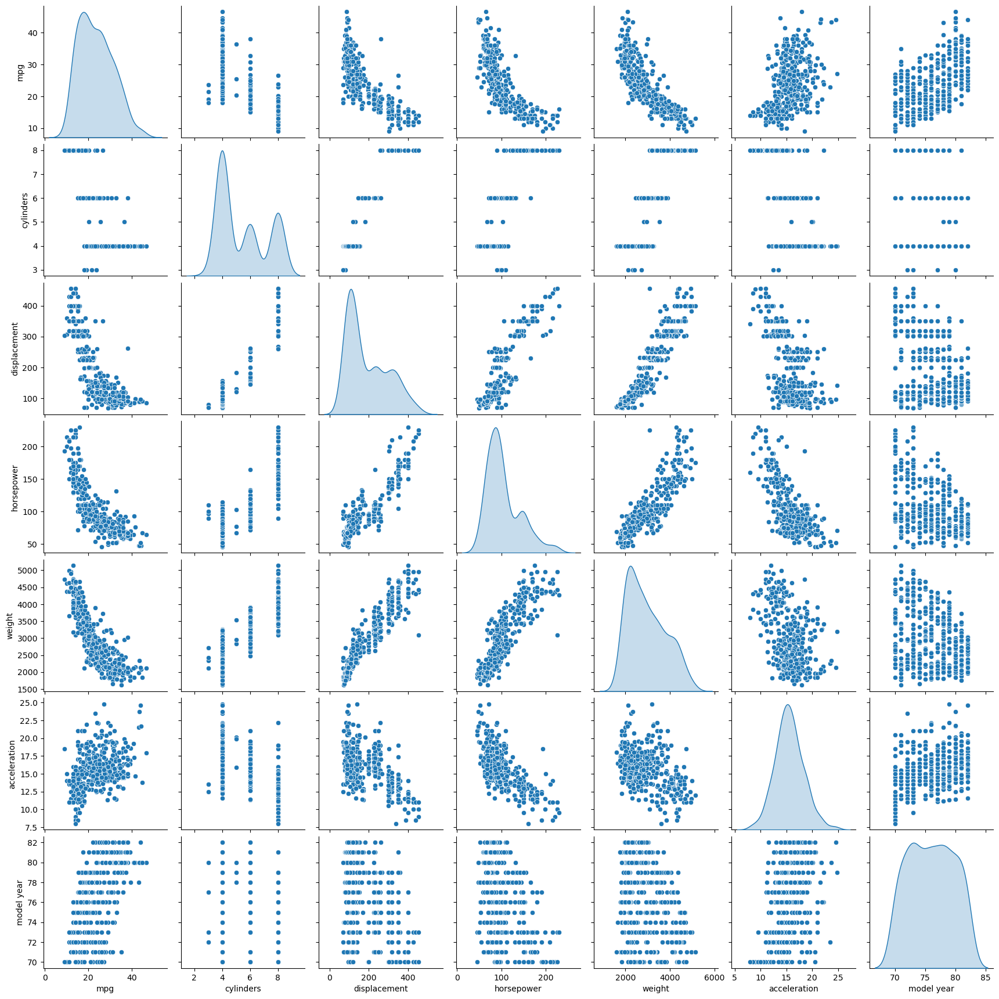

In [14]:
cData_attr = cData.iloc[:, 0:7]
sns.pairplot(
    cData_attr, diag_kind="kde"
)  # to plot density curve instead of histogram on the diag

Observe that the relationship between 'mpg' and other attributes is not really linear.

However, the plots also indicate that linearity would still capture quite a bit of useful information/pattern.

Several assumptions of classical linear regression seem to be violated

## Create Dummy Variables

Values like 'america' cannot be read into an equation. Using substitutes like 1 for america, 2 for europe and 3 for asia would end up implying that European cars fall exactly half way between American and Asian cars! We don't want to impose such a baseless assumption!

So we create 3 simple true or false columns with titles equivalent to "Is this car American?", "Is this car European?" and "Is this car Asian?". These will be used as independent variables without imposing any kind of ordering between the three regions.

We will also be dropping one of those three columns to ensure there is no linear dependency between the three columns.

In [16]:
# drop_first=True will drop one of the three origin columns
cData = pd.get_dummies(cData, columns=["origin"], drop_first=True)
cData.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model year,origin_asia,origin_europe
0,18.0,8,307.0,130.0,3504,12.0,70,0,0
1,15.0,8,350.0,165.0,3693,11.5,70,0,0
2,18.0,8,318.0,150.0,3436,11.0,70,0,0
3,16.0,8,304.0,150.0,3433,12.0,70,0,0
4,17.0,8,302.0,140.0,3449,10.5,70,0,0


## Split Data

In [18]:
# independent variables
X = cData.drop(["mpg"], axis=1)
# dependent variable
y = cData[["mpg"]]

In [19]:
# let's add the intercept to data
X = sm.add_constant(X)

## We will now split X and y into train and test sets in a 70:30 ratio.

In [20]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=1
)

In [21]:
print(X_train.head())

     const  cylinders  displacement  horsepower  weight  acceleration  \
350    1.0          4         105.0        63.0    2215          14.9   
59     1.0          4          97.0        54.0    2254          23.5   
120    1.0          4         121.0       112.0    2868          15.5   
12     1.0          8         400.0       150.0    3761           9.5   
349    1.0          4          91.0        68.0    1985          16.0   

     model year  origin_asia  origin_europe  
350          81            0              0  
59           72            0              1  
120          73            0              1  
12           70            0              0  
349          81            1              0  


In [22]:
print(X_test.head())

     const  cylinders  displacement  horsepower  weight  acceleration  \
174    1.0          6         171.0        97.0    2984          14.5   
359    1.0          4         141.0        80.0    3230          20.4   
250    1.0          8         318.0       140.0    3735          13.2   
274    1.0          5         131.0       103.0    2830          15.9   
283    1.0          6         232.0        90.0    3265          18.2   

     model year  origin_asia  origin_europe  
174          75            0              0  
359          81            0              1  
250          78            0              0  
274          78            0              1  
283          79            0              0  


## Fit Linear Model

In [24]:
olsmod = sm.OLS(y_train, X_train)
olsres = olsmod.fit()

In [25]:
# let's print the regression summary
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                    mpg   R-squared:                       0.814
Model:                            OLS   Adj. R-squared:                  0.809
Method:                 Least Squares   F-statistic:                     147.3
Date:                Fri, 23 Jun 2023   Prob (F-statistic):           1.20e-93
Time:                        11:40:13   Log-Likelihood:                -734.21
No. Observations:                 278   AIC:                             1486.
Df Residuals:                     269   BIC:                             1519.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -21.2847      5.679     -3.748

## Interpretation of R-squared

The R-squared value tells us that our model can explain 81.4% of the variance in the training set.

In [26]:
olsmod_test = sm.OLS(y_test, X_test)
olsres_test = olsmod_test.fit()

In [27]:
# let's print the regression summary for test data
print(olsres_test.summary())

                            OLS Regression Results                            
Dep. Variable:                    mpg   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.855
Method:                 Least Squares   F-statistic:                     88.91
Date:                Fri, 23 Jun 2023   Prob (F-statistic):           1.11e-44
Time:                        17:00:12   Log-Likelihood:                -294.23
No. Observations:                 120   AIC:                             606.5
Df Residuals:                     111   BIC:                             631.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const           -18.3809      8.150     -2.255

## Logistic Regression

In [28]:
# !pip install imblearn

# To enable plotting graphs in Jupyter notebook
%matplotlib inline 

In [30]:
# Since it is a data file with no header, we will supply the column names which have been obtained from the above URL 
# Create a python list of column names called "names"

colnames = ['preg', 'plas', 'pres', 'skin', 'test', 'mass', 'pedi', 'age', 'class']

#Load the file from local directory using pd.read_csv which is a special form of read_table
#while reading the data, supply the "colnames" list

pima_df = pd.read_csv("pima-indians-diabetes.data", names= colnames)

In [31]:
pima_df.head(20)

,preg,plas,pres,skin,test,mass,pedi,age,class
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [32]:
# Let us check whether any of the columns has any value other than numeric i.e. data is not corrupted such as a "?" instead of 
# a number.

# we use np.isreal a numpy function which checks each column for each row and returns a bool array, 
# where True if input element is real.
# applymap is pandas dataframe function that applies the np.isreal function columnwise
# Following line selects those rows which have some non-numeric value in any of the columns hence the  ~ symbol

pima_df[~pima_df.applymap(np.isreal).all(1)]

,preg,plas,pres,skin,test,mass,pedi,age,class


In [33]:
# replace the missing values in pima_df with median value :Note, we do not need to specify the column names
# every column's missing value is replaced with that column's median respectively
#pima_df = pima_df.fillna(pima_df.median())
#pima_df

In [34]:
#Lets analysze the distribution of the various attributes
pima_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
preg,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
plas,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
pres,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
skin,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
test,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
mass,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
pedi,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
class,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [35]:
# Let us look at the target column which is 'class' to understand how the data is distributed amongst the various values
pima_df.groupby(["class"]).count()

# Most are not diabetic. The ratio is almost 1:2 in favor or class 0.  The model's ability to predict class 0 will 
# be better than predicting class 1. 

,preg,plas,pres,skin,test,mass,pedi,age
class,,,,,,,,
0,500,500,500,500,500,500,500,500
1,268,268,268,268,268,268,268,268


In [36]:
pima_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   preg    768 non-null    int64  
 1   plas    768 non-null    int64  
 2   pres    768 non-null    int64  
 3   skin    768 non-null    int64  
 4   test    768 non-null    int64  
 5   mass    768 non-null    float64
 6   pedi    768 non-null    float64
 7   age     768 non-null    int64  
 8   class   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


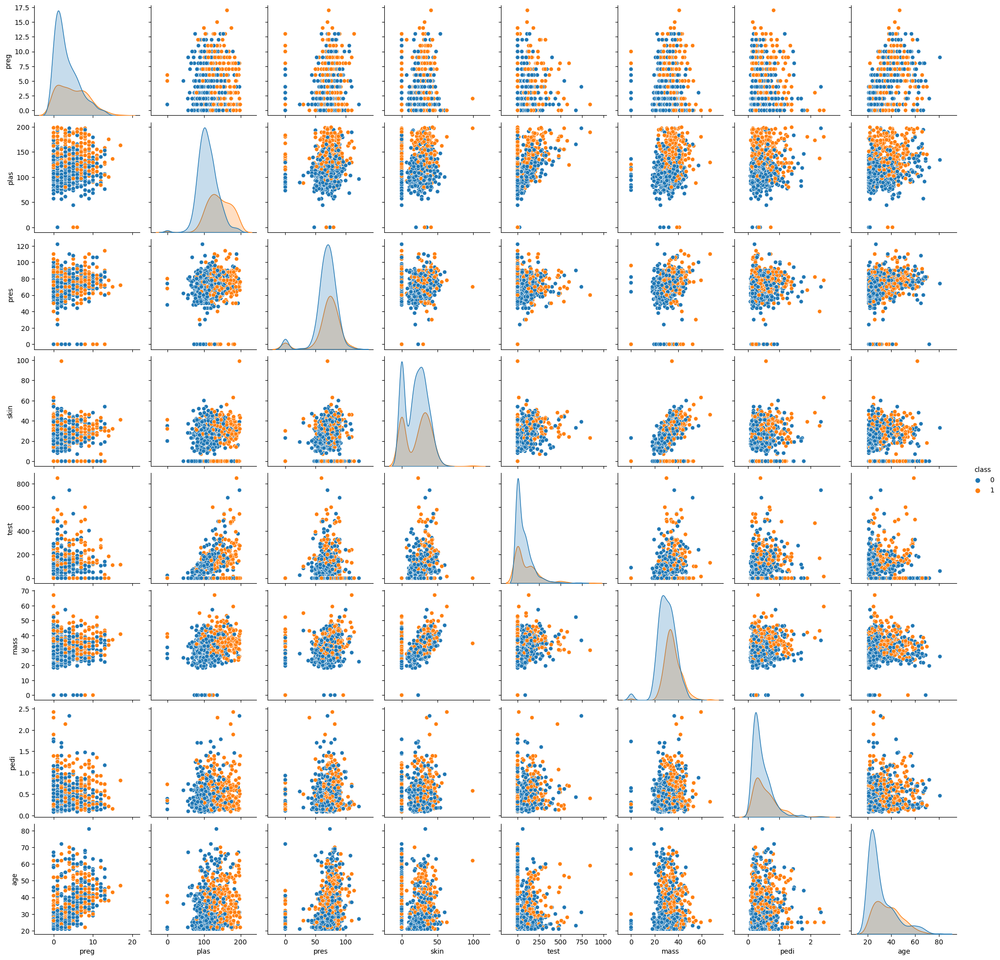

In [37]:
# Pairplot using sns

sns.pairplot(pima_df , hue='class' , diag_kind = 'kde')

In [38]:
#data for all the attributes are skewed, especially for the variable "test"

#The mean for test is 80(rounded) while the median is 30.5 which clearly indicates an extreme long tail on the right

In [39]:
# Attributes which look normally distributed (plas, pres, skin, and mass).
# Some of the attributes look like they may have an exponential distribution (preg, test, pedi, age).
# Age should probably have a normal distribution, the constraints on the data collection may have skewed the distribution.

# There is no obvious relationship between age and onset of diabetes.
# There is no obvious relationship between pedi function and onset of diabetes.


In [40]:
array = pima_df.values
X = array[:,0:7] # select all rows and first 8 columns which are the attributes
Y = array[:,8]   # select all rows and the 8th column which is the classification "Yes", "No" for diabeties
test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)
type(X_train)

numpy.ndarray

In [41]:
# Fit the model on original data i.e. before upsampling
model = LogisticRegression()
model.fit(X_train, y_train)
y_predict = model.predict(X_test)
model_score = model.score(X_test, y_test)
print(model_score)
print(metrics.confusion_matrix(y_test, y_predict))
print(metrics.classification_report(y_test, y_predict))

0.7619047619047619
[[131  16]
 [ 39  45]]
              precision    recall  f1-score   support

         0.0       0.77      0.89      0.83       147
         1.0       0.74      0.54      0.62        84

    accuracy                           0.76       231
   macro avg       0.75      0.71      0.72       231
weighted avg       0.76      0.76      0.75       231



C:\Users\Nishu\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


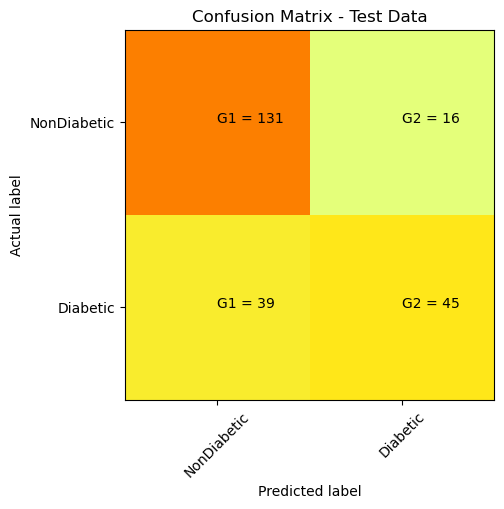

In [42]:
cm = metrics.confusion_matrix(y_test, y_predict)
plt.clf()
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
classNames = ['NonDiabetic', 'Diabetic']
plt.title('Confusion Matrix - Test Data')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
tick_marks = np.arange(len(classNames))
plt.xticks(tick_marks, classNames, rotation=45)
plt.yticks(tick_marks, classNames)
s = [['G1', 'G2'], ['G1','G2']]
 
for i in range(2):
    for j in range(2):
        plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
plt.show()

## Import Excel file
Load the Data file into Python DataFrame using pandas read_csv method

Ensure that data set loaded do not have any unicode character

# LDA

In [44]:
data_df = pd.read_csv("default.csv")

In [46]:
data_df.head(10)

,Gender,Loan.Offered,Job,Work.Exp,Credit.Score,EMI.Ratio,Status,Credit.History,Own house,Purpose,Dependents
0,Male,0,unskilled,14,86,3.0,No,poor,1,personal,2
1,Female,1,skilled,15,94,3.0,No,poor,1,personal,3
2,Male,0,unskilled,16,86,3.0,No,poor,1,personal,2
3,Female,1,skilled,13,94,3.0,No,poor,1,personal,3
4,Male,1,skilled,12,85,3.3,No,poor,1,personal,2
5,Female,1,Management,12,86,3.6,No,critical,1,personal,4
6,Female,1,Management,15,86,3.6,No,critical,1,personal,4
7,Male,1,skilled,12,85,3.6,No,poor,1,personal,2
8,Male,1,skilled,13,87,3.9,No,critical,1,personal,2
9,Male,1,skilled,13,89,4.0,No,critical,1,personal,0


In [47]:
data_df.describe()

,Loan.Offered,Work.Exp,Credit.Score,EMI.Ratio,Own house,Dependents
count,781.000000,781.000000,781.000000,781.000000,781.000000,781.000000
mean,0.756722,12.377721,83.597951,9.495006,0.768246,2.081946
std,0.429336,3.809161,12.040410,2.786867,0.422223,1.068641
min,0.000000,0.000000,42.000000,3.000000,0.000000,0.000000
25%,1.000000,11.000000,83.000000,7.400000,1.000000,2.000000
50%,1.000000,13.000000,87.000000,9.500000,1.000000,2.000000
75%,1.000000,15.000000,91.000000,11.400000,1.000000,3.000000
max,1.000000,19.000000,99.000000,15.000000,1.000000,4.000000


In [48]:
data_df.dtypes

Gender             object
Loan.Offered        int64
Job                object
Work.Exp            int64
Credit.Score        int64
EMI.Ratio         float64
Status             object
Credit.History     object
Own house           int64
Purpose            object
Dependents          int64
dtype: object

In [49]:
type(data_df)

pandas.core.frame.DataFrame

In [50]:
# Check for missing values
data_df.isnull().sum()

Gender            0
Loan.Offered      0
Job               0
Work.Exp          0
Credit.Score      0
EMI.Ratio         0
Status            0
Credit.History    0
Own house         0
Purpose           0
Dependents        0
dtype: int64

In [51]:
data_df.shape ### 781 rows and 11 features

(781, 11)

In [52]:
# Convert Own House into object
data_df['Own house']=data_df['Own house'].astype('object')

### Find out unique values in each categorical column

In [53]:
data_df['Gender'].unique()

array(['Male', 'Female'], dtype=object)

In [54]:
data_df['Job'].unique()

array(['unskilled', 'skilled', 'Management'], dtype=object)

In [55]:
data_df['Status'].unique() ### No means No Default

array(['No', 'Default'], dtype=object)

In [56]:
data_df['Credit.History'].unique()

array(['poor', 'critical', 'good', 'very good', 'verygood', 'Poor'],
      dtype=object)

In [57]:
data_df['Own house'].unique()

array([1, 0], dtype=object)

In [58]:
data_df['Purpose'].unique()

array(['personal', 'car', 'education', 'consumer.durable'], dtype=object)

In [59]:
data_df.dtypes

Gender             object
Loan.Offered        int64
Job                object
Work.Exp            int64
Credit.Score        int64
EMI.Ratio         float64
Status             object
Credit.History     object
Own house          object
Purpose            object
Dependents          int64
dtype: object

## Clean the dataset -- Correction in the values

In [60]:
data_df['Credit.History']=np.where(data_df['Credit.History'] =='very good', 'verygood', data_df['Credit.History'])

In [61]:
data_df['Credit.History']=np.where(data_df['Credit.History'] =='Poor', 'poor', data_df['Credit.History'])

In [62]:
data_df['Credit.History'].unique()

array(['poor', 'critical', 'good', 'verygood'], dtype=object)

## Count of Default and No Default in the Target Column

In [63]:
data_df['Status'].value_counts()

No         656
Default    125
Name: Status, dtype: int64

## Univariate Plots

C:\Users\Nishu\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


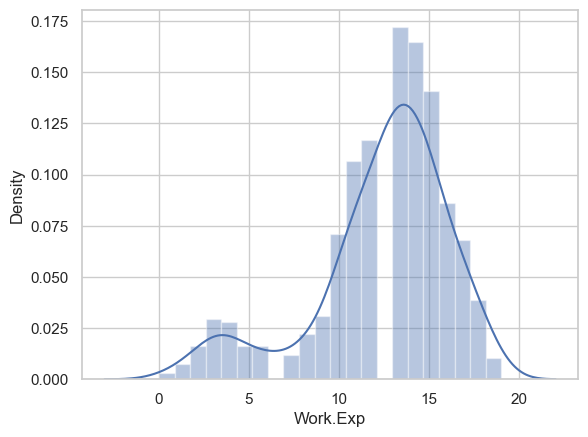

In [64]:
sns.distplot(data_df['Work.Exp'])
plt.show() ### Not required in this version, inserted just to show that if graph is not printing then this is required

## Bivariate Analysis

Bivariate shown below is only as a sample.. Reader is adviced to perform complete data exploration process

C:\Users\Nishu\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


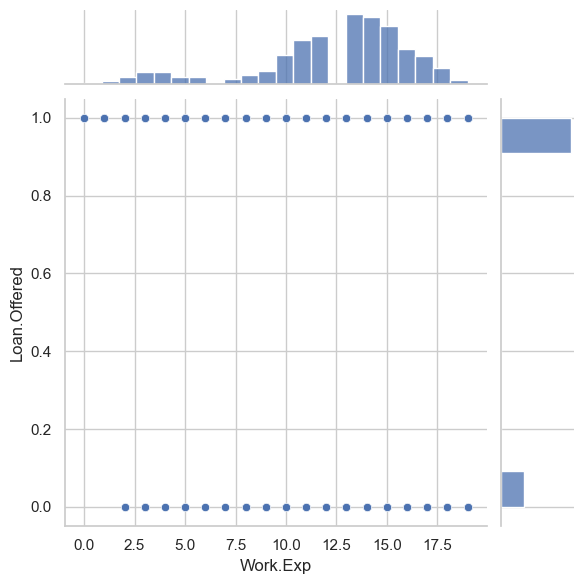

In [65]:
sns.jointplot(data_df['Work.Exp'], data_df['Loan.Offered']) ### annotate function of stats is to print correlation value

C:\Users\Nishu\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Status', ylabel='Work.Exp'>

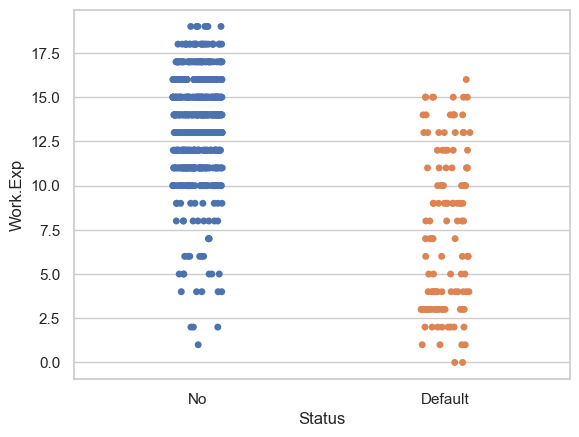

In [66]:
sns.stripplot(data_df['Status'], data_df['Work.Exp']) ### Concentration of observations

 Lower Work Experience have more concentration of Default.. Reader is adviced to perform more analysis and generate insight.

In [67]:
# Find the Distribution of Dependent Variable Categories
count_no_sub = len(data_df[data_df['Status']=='No'])
count_sub = len(data_df[data_df['Status']=='Default'])
pct_of_no_sub = count_no_sub/(count_no_sub+count_sub)
print("percentage of no Default is", pct_of_no_sub*100)
pct_of_sub = count_sub/(count_no_sub+count_sub)
print("percentage of Default", pct_of_sub*100)

percentage of no Default is 83.99487836107554
percentage of Default 16.005121638924454


 
 Distribution is not biased and hence no need to use SMOTE or any other package to balance binary classes

Text(0, 0.5, 'Status')

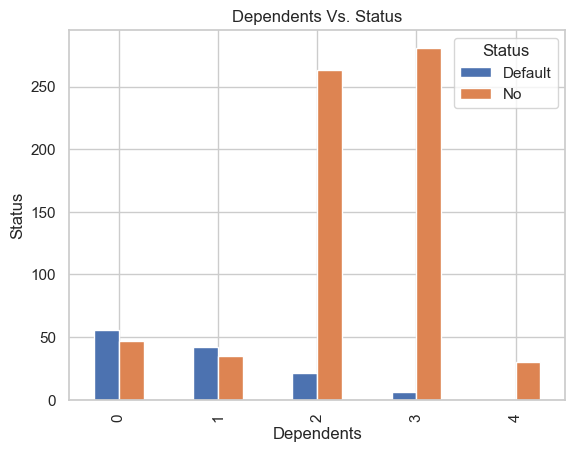

In [68]:
pd.crosstab(data_df.Dependents,data_df.Status).plot(kind='bar')
plt.title('Dependents Vs. Status')
plt.xlabel('Dependents')
plt.ylabel('Status')

Below commands are only done as a good practice.. Not mandatory

In [69]:
data_df.rename(columns = {'Own house':'Ownhouse'}, inplace = True) 
data_df.rename(columns = {'Loan.Offered':'LoanOffered'}, inplace = True) 
data_df.rename(columns = {'Work.Exp':'WorkExp'}, inplace = True) 
data_df.rename(columns = {'Credit.Score':'CreditScore'}, inplace = True) 
data_df.rename(columns = {'EMI.Ratio':'EMIRatio'}, inplace = True) 
data_df.rename(columns = {'Credit.History':'CreditHistory'}, inplace = True) 

In [70]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 781 entries, 0 to 780
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Gender         781 non-null    object 
 1   LoanOffered    781 non-null    int64  
 2   Job            781 non-null    object 
 3   WorkExp        781 non-null    int64  
 4   CreditScore    781 non-null    int64  
 5   EMIRatio       781 non-null    float64
 6   Status         781 non-null    object 
 7   CreditHistory  781 non-null    object 
 8   Ownhouse       781 non-null    object 
 9   Purpose        781 non-null    object 
 10  Dependents     781 non-null    int64  
dtypes: float64(1), int64(4), object(6)
memory usage: 67.2+ KB


## Convert Object Feature types for Linear Discriminant Analysis

In [71]:
data_df['Gender']=np.where(data_df['Gender'] =='Male', 1, data_df['Gender'])
data_df['Gender']=np.where(data_df['Gender'] =='Female', 0, data_df['Gender'])

In [72]:
data_df['Job']=np.where(data_df['Job'] =='Management', 1, data_df['Job'])
data_df['Job']=np.where(data_df['Job'] =='unskilled', 0, data_df['Job'])
data_df['Job']=np.where(data_df['Job'] =='skilled', 2, data_df['Job'])

In [73]:
data_df['CreditHistory']=np.where(data_df['CreditHistory'] =='critical', 1, data_df['CreditHistory'])
data_df['CreditHistory']=np.where(data_df['CreditHistory'] =='poor', 0, data_df['CreditHistory'])
data_df['CreditHistory']=np.where(data_df['CreditHistory'] =='good', 2, data_df['CreditHistory'])
data_df['CreditHistory']=np.where(data_df['CreditHistory'] =='verygood', 3, data_df['CreditHistory'])

In [74]:
data_df['Purpose']=np.where(data_df['Purpose'] =='personal', 1, data_df['Purpose'])
data_df['Purpose']=np.where(data_df['Purpose'] =='car', 0, data_df['Purpose'])
data_df['Purpose']=np.where(data_df['Purpose'] =='education', 2, data_df['Purpose'])
data_df['Purpose']=np.where(data_df['Purpose'] =='consumer.durable', 3, data_df['Purpose'])

In [75]:
data_df.head()

,Gender,LoanOffered,Job,WorkExp,CreditScore,EMIRatio,Status,CreditHistory,Ownhouse,Purpose,Dependents
0,1,0,0,14,86,3.0,No,0,1,1,2
1,0,1,2,15,94,3.0,No,0,1,1,3
2,1,0,0,16,86,3.0,No,0,1,1,2
3,0,1,2,13,94,3.0,No,0,1,1,3
4,1,1,2,12,85,3.3,No,0,1,1,2


In [135]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 781 entries, 0 to 780
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Gender         781 non-null    object 
 1   LoanOffered    781 non-null    int64  
 2   Job            781 non-null    object 
 3   WorkExp        781 non-null    int64  
 4   CreditScore    781 non-null    int64  
 5   EMIRatio       781 non-null    float64
 6   Status         781 non-null    object 
 7   CreditHistory  781 non-null    object 
 8   Ownhouse       781 non-null    object 
 9   Purpose        781 non-null    object 
 10  Dependents     781 non-null    int64  
 11  Prediction     781 non-null    object 
dtypes: float64(1), int64(4), object(7)
memory usage: 73.3+ KB


In [76]:
#Scaling the data which is a pre-requisite for LDA 
scaler=StandardScaler()
X = scaler.fit_transform(data_df.drop(['Status'],axis=1))
Y = data_df['Status']

In [77]:
Y.value_counts()

No         656
Default    125
Name: Status, dtype: int64

In [78]:
Y.replace({"No":1,"Default":0})

0      1
1      1
2      1
3      1
4      1
      ..
776    0
777    0
778    0
779    0
780    0
Name: Status, Length: 781, dtype: int64

In [79]:
#Build LDA Model
# Refer details for LDA at http://scikit-learn.org/stable/modules/generated/sklearn.discriminant_analysis.LinearDiscriminantAnalysis.html
clf = LinearDiscriminantAnalysis()
model=clf.fit(X,Y)
model

LinearDiscriminantAnalysis()

In [80]:
# Predict it
pred_class = model.predict(X)
data_df['Prediction'] = pred_class 

In [81]:
# Check Correlation values
#Refer on correlation at https://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.corr.html
data= data_df[['Gender','LoanOffered','Job','WorkExp','CreditScore','EMIRatio','CreditHistory','Ownhouse','Purpose','Dependents']]
Cor1 = data.corr()
Cor1

,LoanOffered,WorkExp,CreditScore,EMIRatio,Dependents
LoanOffered,1.000000,-0.076224,-0.082435,0.057273,-0.029145
WorkExp,-0.076224,1.000000,0.915575,-0.300286,0.408753
CreditScore,-0.082435,0.915575,1.000000,-0.382192,0.490798
EMIRatio,0.057273,-0.300286,-0.382192,1.000000,-0.251782
Dependents,-0.029145,0.408753,0.490798,-0.251782,1.000000


In [82]:
#generate Confusion Matrix
# Please refer for confusion matrix http://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html
confusion_matrix(Y, pred_class)

array([[124,   1],
       [ 22, 634]], dtype=int64)

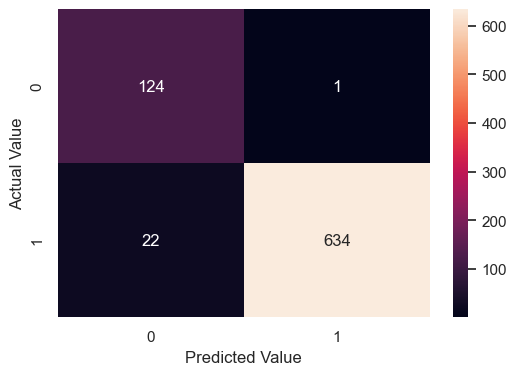

In [83]:
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(Y, pred_class),annot=True,fmt='.4g'),'\n\n'
plt.ylabel('Actual Value')
plt.xlabel('Predicted Value')
plt.show();

#### 146 rows classified as 0 (Default) and 635 rows classified as 1 (Not Default)

In [84]:
from sklearn.metrics import classification_report
print(classification_report(Y, pred_class))

              precision    recall  f1-score   support

     Default       0.85      0.99      0.92       125
          No       1.00      0.97      0.98       656

    accuracy                           0.97       781
   macro avg       0.92      0.98      0.95       781
weighted avg       0.97      0.97      0.97       781



In [85]:
X.shape

(781, 10)

In [86]:
model.coef_

array([[ 1.137129  , -0.46395456,  0.83372221, -1.08383805,  3.80345376,
        -0.53102867,  0.36191579,  5.95912536,  0.14435512,  2.30379498]])

In [87]:
model.intercept_

array([9.15964746])

#### LDF for the above model will be

In [88]:
'''
LDF=9.159+ X1*1.137 + X2*(-0.463) + X3*(0.833) + X4*(-1.083) + X5*3.803 + X6*(-0.531) + X7*0.361 + X8*5.959 + X9*0.144 + X10*2.30
'''

'\nLDF=9.159+ X1*1.137 + X2*(-0.463) + X3*(0.833) + X4*(-1.083) + X5*3.803 + X6*(-0.531) + X7*0.361 + X8*5.959 + X9*0.144 + X10*2.30\n'

### So from the above equation the following things can be summarized as

- the coeff of X8 predictor is largest in magnitude thus it helps in discriminating the target the best 
- the coeff of X2 predictor is smallest in magnitude thus it helps in discriminating the target the least.
- all the DS can be computed for each row using the above f(x) which will aid in classification

## Classification by Discriminant Score

In [89]:
#Computation of Discriminant Scores/LDF for each row of data


DS=[]
coef=[1.137129  , -0.46395456,  0.83372221, -1.08383805,  3.80345376,
        -0.53102867,  0.36191579,  5.95912536,  0.14435512,  2.30379498] # Coefficients 
for p in range(len(X)):
    s3=0
    for q in range(X.shape[1]):
        s3=s3+(X[p,q]*coef[q]) # Building the LDF equation 
    s3=s3+9.159
    DS.append(s3)

In [90]:
'''
Classification Rule :

if LDF>=0 then Classify as 1 
else if LDF <0 then Classify as 0 
'''


s1=0
s2=0
for i in range(len(X)):
    if DS[i]>=0:
        print("FOR Row:",i," ",X[i,:])
        print()
        #print("-->","{ prob(Y=1|X) =",pred_prob[:,1][i],">0.5 is True}")
        print("-->","{ DS: ",DS[i],">=0 , Classify as 1}")
        print("------------------------------------------------------------------------------------------")
        s1+=1
    elif DS[i]<0:
        print("FOR Row:",i," ",X[i,:])
        print()
        #print("-->","{ prob(Y=1|X) =",pred_prob[:,1][i],">0.5 is True}")
        print("-->","{ DS: ",DS[i],"<0 , Classify as 0}")
        print("------------------------------------------------------------------------------------------")
        s2+=1



FOR Row: 0   [ 0.65206018 -1.76366843 -2.20488852  0.42616174  0.19962674 -2.33206968
 -1.80993827  0.5492419  -0.42611361 -0.07673177]

--> { DS:  12.795920822262884 >=0 , Classify as 1}
------------------------------------------------------------------------------------------
FOR Row: 1   [-1.53360077  0.567       0.58832792  0.68885497  0.8644817  -2.33206968
 -1.80993827  0.5492419  -0.42611361  0.85963561]

--> { DS:  15.959211343453298 >=0 , Classify as 1}
------------------------------------------------------------------------------------------
FOR Row: 2   [ 0.65206018 -1.76366843 -2.20488852  0.9515482   0.19962674 -2.33206968
 -1.80993827  0.5492419  -0.42611361 -0.07673177]

--> { DS:  12.226486990137262 >=0 , Classify as 1}
------------------------------------------------------------------------------------------
FOR Row: 3   [-1.53360077  0.567       0.58832792  0.16346851  0.8644817  -2.33206968
 -1.80993827  0.5492419  -0.42611361  0.85963561]

--> { DS:  16.528645175578

In [91]:
print(s1," rows classified as 1 (Not Default) ")
print(s2," rows classified as 0 (Default) ")

635  rows classified as 1 (Not Default) 
146  rows classified as 0 (Default) 


### Classification by Probability

In [92]:
pred_prob=model.predict_proba(X)#Posterior Probability for each row

In [93]:
pred_prob[:,1]

array([9.99997230e-01, 9.99999883e-01, 9.99995104e-01, 9.99999934e-01,
       9.99999346e-01, 9.99999818e-01, 9.99999571e-01, 9.99999307e-01,
       9.99999636e-01, 9.99985261e-01, 9.99999641e-01, 9.99964028e-01,
       9.99999504e-01, 9.99999816e-01, 9.99999944e-01, 9.99999600e-01,
       9.99998776e-01, 9.99998879e-01, 9.99999957e-01, 9.99969492e-01,
       9.99968905e-01, 9.99999447e-01, 9.99945047e-01, 9.99999605e-01,
       9.99999805e-01, 9.99945047e-01, 9.99999605e-01, 9.99999000e-01,
       9.99999867e-01, 9.99999426e-01, 9.99999849e-01, 9.99999886e-01,
       9.99999276e-01, 9.99999662e-01, 9.99997674e-01, 9.99998690e-01,
       9.99999591e-01, 9.99998592e-01, 9.99999019e-01, 9.99999578e-01,
       9.99999583e-01, 9.99998721e-01, 9.99999784e-01, 9.99999548e-01,
       9.99999352e-01, 9.99999747e-01, 9.99999878e-01, 9.99999809e-01,
       9.99999421e-01, 9.99999417e-01, 9.99997974e-01, 9.99999957e-01,
       9.99999930e-01, 9.99995647e-01, 9.99998811e-01, 9.99999106e-01,
      

In [94]:
'''
Classification Rule :

if prob(Y=1|X) >=0 then Classify as 1 
else ifprob(Y=1|X) <0 then Classify as 0 
'''


s3,s4=0,0
for i in range(len(pred_prob[:,1])):
    if pred_prob[:,1][i]>=0.5:
        print("FOR Row:",i," ",X[i,:])
        print()
        print("-->","{ prob(Y=1|X) =",pred_prob[:,1][i],">=0.5 , Classify as 1 }")
        print("------------------------------------------------------------------------------------------")
        s3+=1
    elif pred_prob[:,1][i]<0.5:
        print("FOR Row:",i," ",X[i,:])
        print()
        print("-->","{ prob(Y=1|X) =",pred_prob[:,1][i],"< 0.5 , Classify as 0 }")
        print("------------------------------------------------------------------------------------------")
        s4+=1

FOR Row: 0   [ 0.65206018 -1.76366843 -2.20488852  0.42616174  0.19962674 -2.33206968
 -1.80993827  0.5492419  -0.42611361 -0.07673177]

--> { prob(Y=1|X) = 0.999997229744646 >=0.5 , Classify as 1 }
------------------------------------------------------------------------------------------
FOR Row: 1   [-1.53360077  0.567       0.58832792  0.68885497  0.8644817  -2.33206968
 -1.80993827  0.5492419  -0.42611361  0.85963561]

--> { prob(Y=1|X) = 0.9999998828556507 >=0.5 , Classify as 1 }
------------------------------------------------------------------------------------------
FOR Row: 2   [ 0.65206018 -1.76366843 -2.20488852  0.9515482   0.19962674 -2.33206968
 -1.80993827  0.5492419  -0.42611361 -0.07673177]

--> { prob(Y=1|X) = 0.9999951042317538 >=0.5 , Classify as 1 }
------------------------------------------------------------------------------------------
FOR Row: 3   [-1.53360077  0.567       0.58832792  0.16346851  0.8644817  -2.33206968
 -1.80993827  0.5492419  -0.42611361  0.85

In [95]:
print(s3," rows classified as 1 (Not Default) ")
print(s4," rows classified as 0 (Default) ")

635  rows classified as 1 (Not Default) 
146  rows classified as 0 (Default) 


# CART

In [97]:
heart_df = pd.read_csv(r"Downloads/heart.csv")

In [98]:
heart_df.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [99]:
heart_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [100]:
# capture the target column ("default") into separate vectors for training set and test set

X = heart_df.drop("target" , axis=1)

y = heart_df.pop("target")

In [111]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

X_train, X_test, train_labels, test_labels = train_test_split(X, y, test_size=.30, random_state=1)

In [112]:
dt_model = DecisionTreeClassifier(criterion = 'gini' )

In [114]:
dt_model.fit(X_train, train_labels)

DecisionTreeClassifier()

In [115]:
 from sklearn import tree

train_char_label = ['No', 'Yes']
Credit_Tree_File_test = open(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\credit_tree.dot','w')
dot_data = tree.export_graphviz(dt_model, out_file=Credit_Tree_File_test, feature_names = list(X_train), class_names = list(train_char_label))

Credit_Tree_File_test.close()


In [116]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

               Imp
age       0.101419
sex       0.017135
cp        0.317749
trestbps  0.075549
chol      0.064827
fbs       0.000000
restecg   0.014254
thalach   0.052067
exang     0.104699
oldpeak   0.082696
slope     0.000000
ca        0.135169
thal      0.034436


In [117]:
y_predict = dt_model.predict(X_test)

## Regularising the Decision Tree

In [119]:
reg_dt_model = DecisionTreeClassifier(criterion = 'gini', max_depth = 7,min_samples_leaf=10,min_samples_split=30)
reg_dt_model.fit(X_train, train_labels)

DecisionTreeClassifier(max_depth=7, min_samples_leaf=10, min_samples_split=30)

In [122]:
 credit_tree_regularized = open(r'C:\Users\Nishu\OneDrive\Desktop\DSBA Program\credit_tree_regularized.dot','w')
dot_data = tree.export_graphviz(reg_dt_model, out_file= credit_tree_regularized , feature_names = list(X_train), class_names = list(train_char_label))

credit_tree_regularized.close()

print (pd.DataFrame(dt_model.feature_importances_, columns = ["Imp"], index = X_train.columns))

               Imp
age       0.101419
sex       0.017135
cp        0.317749
trestbps  0.075549
chol      0.064827
fbs       0.000000
restecg   0.014254
thalach   0.052067
exang     0.104699
oldpeak   0.082696
slope     0.000000
ca        0.135169
thal      0.034436


In [123]:
ytrain_predict = reg_dt_model.predict(X_train)
ytest_predict = reg_dt_model.predict(X_test)

In [124]:
import matplotlib.pyplot as plt

AUC: 0.945


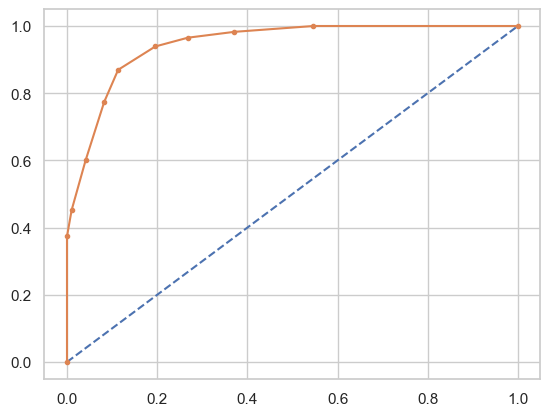

In [125]:
# AUC and ROC for the training data

# predict probabilities
probs = reg_dt_model.predict_proba(X_train)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(train_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(train_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

AUC: 0.744


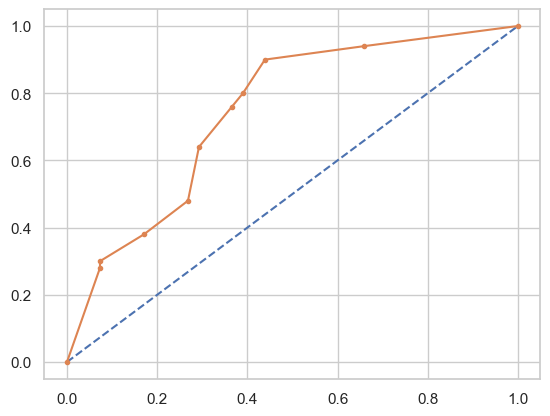

In [126]:
# AUC and ROC for the test data


# predict probabilities
probs = reg_dt_model.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
from sklearn.metrics import roc_auc_score
auc = roc_auc_score(test_labels, probs)
print('AUC: %.3f' % auc)
# calculate roc curve
from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(test_labels, probs)
plt.plot([0, 1], [0, 1], linestyle='--')
# plot the roc curve for the model
plt.plot(fpr, tpr, marker='.')
# show the plot
plt.show()

In [127]:
from sklearn.metrics import classification_report,confusion_matrix

In [128]:
print(classification_report(train_labels, ytrain_predict))

              precision    recall  f1-score   support

           0       0.85      0.89      0.87        97
           1       0.90      0.87      0.88       115

    accuracy                           0.88       212
   macro avg       0.88      0.88      0.88       212
weighted avg       0.88      0.88      0.88       212



In [129]:
print(classification_report(test_labels, ytest_predict))

              precision    recall  f1-score   support

           0       0.62      0.71      0.66        41
           1       0.73      0.64      0.68        50

    accuracy                           0.67        91
   macro avg       0.67      0.67      0.67        91
weighted avg       0.68      0.67      0.67        91



In [130]:
confusion_matrix(train_labels, ytrain_predict)

array([[ 86,  11],
       [ 15, 100]], dtype=int64)

In [131]:
confusion_matrix(test_labels, ytest_predict)

array([[29, 12],
       [18, 32]], dtype=int64)

In [132]:
reg_dt_model.score(X_train,train_labels)

0.8773584905660378

In [133]:
reg_dt_model.score(X_test,test_labels)

0.6703296703296703

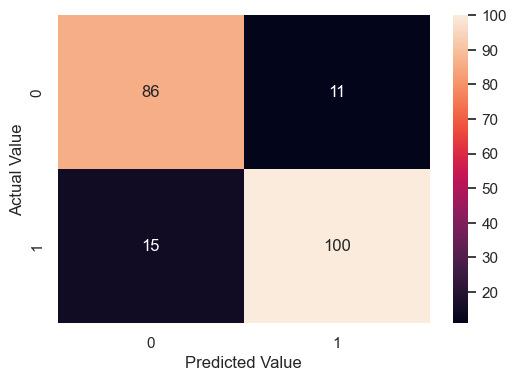

In [134]:
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(train_labels, ytrain_predict),annot=True,fmt='.4g'),'\n\n'
plt.ylabel('Actual Value')
plt.xlabel('Predicted Value')
plt.show();

# Machine Learning

In [2]:
dataframe = pd.read_csv(r'Downloads/pima-indians-diabetes.csv')

In [3]:
dataframe.head()

,Preg,Plas,Pres,skin,test,mass,pedi,age,class
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


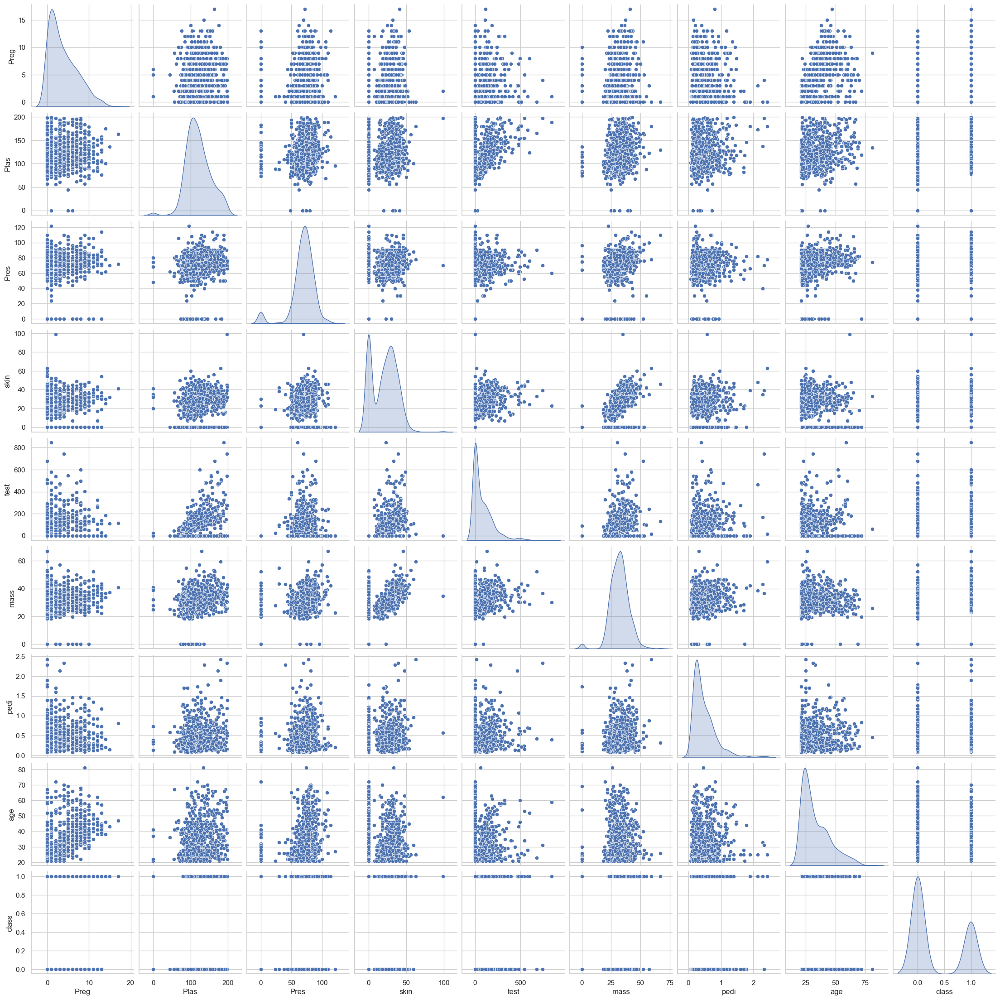

In [4]:
# To enable plotting graphs in Jupyter notebook
%matplotlib inline
import seaborn as sns

sns.pairplot(dataframe, diag_kind='kde')

In [5]:
array = dataframe.values
X = array[:,0:8] # select all rows and first 7 columns which are the attributes
Y = array[:,8]   # select all rows and the 8th column which is the classification "Yes", "No" for diabeties
test_size = 0.30 # taking 70:30 training and test set
seed = 7  # Random numbmer seeding for reapeatability of the code
X_train, X_test, Y_train, Y_test = model_selection.train_test_split(X, Y, test_size=test_size, random_state=seed)

In [6]:
model = GaussianNB()
model.fit(X_train, Y_train)
print(model)
# make predictions
expected = Y_test
predicted = model.predict(X_test)
# summarize the fit of the model
print(metrics.classification_report(expected, predicted))
print(metrics.confusion_matrix(expected, predicted))

GaussianNB()
              precision    recall  f1-score   support

         0.0       0.80      0.79      0.79       147
         1.0       0.64      0.65      0.65        84

    accuracy                           0.74       231
   macro avg       0.72      0.72      0.72       231
weighted avg       0.74      0.74      0.74       231

[[116  31]
 [ 29  55]]


Precision: Within a given set of positively-labeled results, the fraction that were true positives = tp/(tp + fp) Recall: Given a set of positively-labeled results, the fraction of all positives that were retrieved = tp/(tp + fn) Accuracy: tp + tn / (tp + tn + fp +fn) But this measure can be dominated by larger class. Suppose 10, 90 and 80 of 90 is correctly predicted while only 2 of 0 is predicted correctly. Accuracy is 80+2 / 100 i.e. 82%

TO over come the dominance of the majority class, use weighted measure (not shown)

F is harmonic mean of precision and recal given by ((B^2 +1) PR) / (B^2P +R) When B is set to 1 we get F1 = 2PR / (P+R)

## KNN

In [26]:
NNH = KNeighborsClassifier(n_neighbors= 5 , weights = 'distance' )

In [8]:
bc_df = pd.read_csv(r"Downloads/wisc_bc_data.csv")

In [9]:
bc_df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,87139402,B,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,8910251,B,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,905520,B,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,868871,B,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,9012568,B,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [10]:
bc_df.shape

(569, 32)

In [11]:
bc_df.dtypes

id                     int64
diagnosis             object
radius_mean          float64
texture_mean         float64
perimeter_mean       float64
area_mean            float64
smoothness_mean      float64
compactness_mean     float64
concavity_mean       float64
points_mean          float64
symmetry_mean        float64
dimension_mean       float64
radius_se            float64
texture_se           float64
perimeter_se         float64
area_se              float64
smoothness_se        float64
compactness_se       float64
concavity_se         float64
points_se            float64
symmetry_se          float64
dimension_se         float64
radius_worst         float64
texture_worst        float64
perimeter_worst      float64
area_worst           float64
smoothness_worst     float64
compactness_worst    float64
concavity_worst      float64
points_worst         float64
symmetry_worst       float64
dimension_worst      float64
dtype: object

In [12]:
bc_df['diagnosis'] = bc_df.diagnosis.astype('category')
bc_df.dtypes

id                      int64
diagnosis            category
radius_mean           float64
texture_mean          float64
perimeter_mean        float64
area_mean             float64
smoothness_mean       float64
compactness_mean      float64
concavity_mean        float64
points_mean           float64
symmetry_mean         float64
dimension_mean        float64
radius_se             float64
texture_se            float64
perimeter_se          float64
area_se               float64
smoothness_se         float64
compactness_se        float64
concavity_se          float64
points_se             float64
symmetry_se           float64
dimension_se          float64
radius_worst          float64
texture_worst         float64
perimeter_worst       float64
area_worst            float64
smoothness_worst      float64
compactness_worst     float64
concavity_worst       float64
points_worst          float64
symmetry_worst        float64
dimension_worst       float64
dtype: object

In [13]:
bc_df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [14]:
bc_df.groupby(["diagnosis"]).count()

# Class distribution among B and M is almost 2:1. The model will better predict B and M

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,357,357,357,357,357,357,357,357,357,357,...,357,357,357,357,357,357,357,357,357,357
M,212,212,212,212,212,212,212,212,212,212,...,212,212,212,212,212,212,212,212,212,212


drop the first column from the data frame. This is Id column which is not used in modeling

In [15]:
# The first column is id column which is patient id and nothing to do with the model attriibutes. So drop it.

bc_df = bc_df.drop(labels = "id", axis = 1)

In [16]:
bc_df.shape

(569, 31)

In [17]:
    # Create a separate dataframe consisting only of the features i.e independent attributes

    bc_feature_df = bc_df.drop(labels= "diagnosis" , axis = 1)
    bc_feature_df.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
0,12.32,12.39,78.85,464.1,0.10280,0.06981,0.03987,0.03700,0.1959,0.05955,...,13.50,15.64,86.97,549.1,0.1385,0.1266,0.12420,0.09391,0.2827,0.06771
1,10.60,18.95,69.28,346.4,0.09688,0.11470,0.06387,0.02642,0.1922,0.06491,...,11.88,22.94,78.28,424.8,0.1213,0.2515,0.19160,0.07926,0.2940,0.07587
2,11.04,16.83,70.92,373.2,0.10770,0.07804,0.03046,0.02480,0.1714,0.06340,...,12.41,26.44,79.93,471.4,0.1369,0.1482,0.10670,0.07431,0.2998,0.07881
3,11.28,13.39,73.00,384.8,0.11640,0.11360,0.04635,0.04796,0.1771,0.06072,...,11.92,15.77,76.53,434.0,0.1367,0.1822,0.08669,0.08611,0.2102,0.06784
4,15.19,13.21,97.65,711.8,0.07963,0.06934,0.03393,0.02657,0.1721,0.05544,...,16.20,15.73,104.50,819.1,0.1126,0.1737,0.13620,0.08178,0.2487,0.06766


In [20]:
# convert the features into z scores as we do not know what units / scales were used and store them in new dataframe
# It is always adviced to scale numeric attributes in models that calculate distances.

bc_feature_df_z = bc_feature_df.apply(zscore)  # convert all attributes to Z scale 

bc_feature_df_z.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,points_mean,symmetry_mean,dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,points_worst,symmetry_worst,dimension_worst
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-1.287781e-16,-7.373520e-16,-1.303390e-16,-2.239958e-16,1.660457e-16,1.882891e-16,5.112099e-17,-4.760886e-17,1.465338e-16,-1.517240e-15,...,-8.507157e-17,6.634022e-18,-3.570665e-16,-1.888745e-16,-2.234104e-16,7.999850e-18,9.033976e-17,2.224348e-16,2.734583e-16,1.851672e-16
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


In [21]:
# Capture the class values from the 'diagnosis' column into a pandas series akin to array 

bc_labels = bc_df["diagnosis"]

In [22]:
# store the normalized features data into np array 

X = np.array(bc_feature_df_z)
X.shape

(569, 30)

In [23]:
# store the bc_labels data into a separate np array

y = np.array(bc_labels)
y.shape

(569,)

In [24]:
# Split X and y into training and test set in 75:25 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [28]:
# Call Nearest Neighbour algorithm

NNH.fit(X_train, y_train)

KNeighborsClassifier(weights='distance')

In [29]:
# For every test data point, predict it's label based on 5 nearest neighbours in this model. The majority class will 
# be assigned to the test data point

predicted_labels = NNH.predict(X_test)
NNH.score(X_test, y_test)

0.9649122807017544

In [30]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print(metrics.confusion_matrix(y_test, predicted_labels))

[[112   2]
 [  4  53]]


In [31]:
# To improve performance ------------------------- Iteration 2 -----------------------------------

In [32]:
# Let us analyze the different attributes for distribution and the correlation by using scatter matrix

sns.pairplot(bc_df)

In [33]:
# As is evident from the scatter matrix, many dimensions have strong correlation and that is not surprising
# Area and Perimeter are function of radius, so they will have strong correlation. Why take multiple dimensions 
# when they convey the same information to the model?

In [34]:
# To to drop dependent columns from bc_df

bc_features_pruned_df_z =  bc_feature_df_z.drop(['radius_mean'], axis=1)

In [35]:
X = np.array(bc_features_pruned_df_z)



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [36]:
# Call Nearest Neighbour algorithm

NNH.fit(X_train, y_train)

KNeighborsClassifier(weights='distance')

In [37]:
# For every test data point, predict it's label based on 5 nearest neighbours in this model. The majority class will 
# be assigned to the test data point

predicted_labels = NNH.predict(X_test)

In [38]:
# get the accuracy score which is how many test cases were correctly predicted as a ratio of total number of test cases

NNH.score(X_test, y_test)

0.9649122807017544

In [39]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print(metrics.confusion_matrix(y_test, predicted_labels))

[[112   2]
 [  4  53]]


In [40]:
# peformance has dropped! So, be careful about the dimensions you drop. 
#Domain expertise is a must to know whether dropping radius or dropping area
#will be better. The area may be a stronger predictor than radius and the
#way they are calculated under a electron microscope may be effecting the outcome

## Create an imbalanced dataset

In [46]:
X, y = make_classification(n_samples=1000, n_features=2, n_redundant=0, n_clusters_per_class=1, weights=[0.975], flip_y=0, random_state=1)

In [47]:
counter=Counter(y)
counter

Counter({0: 975, 1: 25})

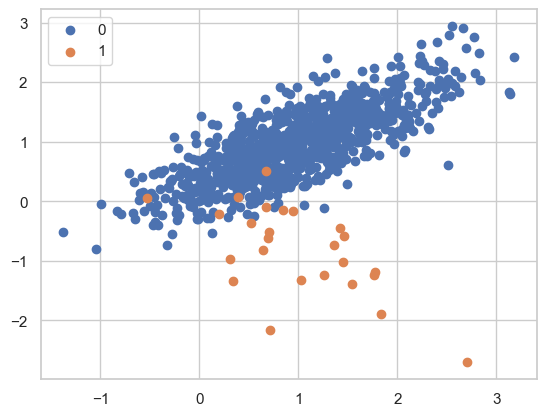

In [50]:
for label, _ in counter.items():
    row_ix = where(y == label)[0]
    plt.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
plt.legend()
plt.show()

## Oversample using SMOTE

In [51]:
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

In [52]:
counter=Counter(y)
counter

Counter({0: 975, 1: 975})

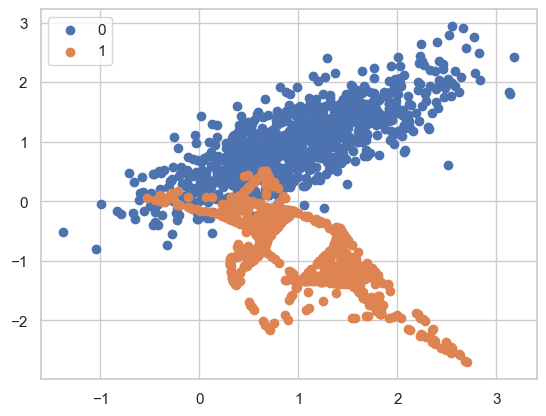

In [53]:
for label, _ in counter.items():
    row_ix = where(y == label)[0]
    plt.scatter(X[row_ix, 0], X[row_ix, 1], label=str(label))
plt.legend()
plt.show()